In [1]:
!pip install GeoPandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 13.9 MB/s 
     |████████████████████████████████| 6.3 MB 66.6 MB/s 
     |████████████████████████████████| 15.4 MB 66.8 MB/s 
     |████████████████████████████████| 19.3 MB 1.1 MB/s 


In [11]:
import geopandas
import pandas as pd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. visualizzi i parchi di Milano e i comuni che vi fanno parte (vedi immagine allegata)

In [4]:
parchi= geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Parchi_regionali_e_nazionali_polygon.zip")
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [5]:
Comuni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021/Com01012021")
Comuni

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,SHAPE_LENG,Shape_Le_1,Shape_Area,geometry
0,1,1,1,201,201,1077,001077,Chiaverano,None,0,18164.369945,18164.236621,1.202212e+07,"POLYGON ((414358.390 5042001.044, 414381.796 5..."
1,1,1,1,201,201,1079,001079,Chiesanuova,None,0,10777.398475,10777.318814,4.118911e+06,"POLYGON ((394621.039 5031581.116, 394716.100 5..."
2,1,1,1,201,201,1089,001089,Coazze,None,0,41591.434852,41591.122092,5.657268e+07,"POLYGON ((364914.897 4993224.894, 364929.991 4..."
3,1,1,1,201,201,1006,001006,Almese,None,0,17058.567837,17058.439037,1.787564e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
4,1,1,1,201,201,1007,001007,Alpette,None,0,9795.635259,9795.562269,5.626076e+06,"POLYGON ((388890.737 5030465.123, 388945.987 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,19,82,282,282,82045,082045,Lercara Friddi,None,0,41752.151492,42315.473379,3.749310e+07,"POLYGON ((911026.790 4190436.780, 911110.915 4..."
7899,5,19,82,282,282,82078,082078,Vicari,None,0,0.000000,56126.024420,8.594625e+07,"POLYGON ((903617.640 4186159.573, 903583.834 4..."
7900,2,4,21,0,21,21076,021076,Salorno sulla strada del vino,Salurn an der WeinstraÃe,0,38330.113460,38329.838310,3.312504e+07,"POLYGON ((676383.291 5127075.411, 676424.729 5..."
7901,3,12,58,258,258,58081,058081,Riano,None,0,30941.918435,31158.226031,2.544838e+07,"POLYGON ((791585.579 4667342.828, 791638.892 4..."


In [6]:
Province = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021/ProvCM01012021")
Province

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,593389.667001,6.826908e+09,"POLYGON ((411015.006 5049970.983, 411070.006 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,458754.449021,2.081602e+09,"POLYGON ((437900.552 5088796.204, 437915.021 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,276722.284585,1.340250e+09,"POLYGON ((459146.367 5079451.275, 459180.648 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,542063.983810,6.894828e+09,"MULTIPOLYGON (((378928.552 4958539.163, 378934..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,356521.052241,1.510170e+09,"POLYGON ((423634.299 4998152.373, 423642.986 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,316521.773202,2.260887e+09,"POLYGON ((456874.626 5145767.794, 456879.627 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,164691.454327,4.054079e+08,"POLYGON ((519686.705 5065270.380, 519754.706 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,226568.225869,8.627532e+08,"POLYGON ((885062.265 4803844.694, 885197.764 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,276175.124779,1.542990e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


In [7]:
Regioni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021/Reg01012021")
Regioni

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry
0,1,1,Piemonte,1.333428e+06,2.538670e+10,"POLYGON ((456874.626 5145767.794, 456879.627 5..."
1,1,2,Valle d'Aosta,3.258364e+05,3.260854e+09,"POLYGON ((389358.653 5093659.158, 389433.654 5..."
2,1,3,Lombardia,1.511132e+06,2.386310e+10,"MULTIPOLYGON (((485366.070 4984899.481, 485306..."
3,2,4,Trentino-Alto Adige,8.598731e+05,1.360472e+10,"POLYGON ((743387.812 5219741.793, 743414.749 5..."
4,2,5,Veneto,1.140433e+06,1.834537e+10,"POLYGON ((768135.210 5175357.497, 768146.460 5..."
5,2,6,Friuli Venezia Giulia,7.692437e+05,7.932482e+09,"MULTIPOLYGON (((872344.457 5061894.048, 872344..."
6,1,7,Liguria,1.079642e+06,5.416152e+09,"MULTIPOLYGON (((568230.816 4874870.697, 568232..."
7,2,8,Emilia-Romagna,1.282028e+06,2.244454e+10,"MULTIPOLYGON (((618335.211 4893983.160, 618329..."
8,3,9,Toscana,1.552065e+06,2.298744e+10,"MULTIPOLYGON (((673999.896 4681200.360, 674032..."
9,3,10,Umbria,6.714160e+05,8.464223e+09,"MULTIPOLYGON (((776426.122 4834159.173, 776480..."


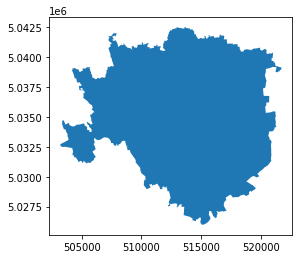

In [12]:
Comuni_Milano =  Comuni[Comuni['COMUNE'] == 'Milano']
Comuni_Milano.plot()

In [13]:
parchi_Milano = parchi[parchi.intersects(Comuni_Milano.geometry.squeeze())]
parchi_Milano

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
20,21,Parco Nord Milano,22,5,Parco di cintura metropolitana,2,Parco Regionale,1,Area Regionale,22:Parco Nord Milano,"POLYGON ((516502.662 5041742.040, 516403.321 5..."
21,22,Parco Sud Milano,23,15,Parco agricolo e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,23:Parco Sud Milano,"POLYGON ((533691.079 5042919.602, 533758.703 5..."


In [15]:
comuni_Intersects = Comuni[Comuni.intersects(parchi_Milano.unary_union)]
comuni_Intersects

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,SHAPE_LENG,Shape_Le_1,Shape_Area,geometry
497,1,3,15,215,215,15071,015071,Cerro al Lambro,None,0,19070.615089,19070.471521,9.963103e+06,"POLYGON ((525220.531 5021959.220, 525224.287 5..."
592,1,3,15,215,215,15237,015237,Vignate,None,0,20282.245667,20282.095166,8.552655e+06,"POLYGON ((529529.257 5040000.567, 529576.443 5..."
594,1,3,15,215,215,15243,015243,Vittuone,None,0,18180.914328,18180.779671,6.133431e+06,"POLYGON ((496408.251 5038462.078, 496453.315 5..."
595,1,3,15,215,215,15244,015244,Vizzolo Predabissi,None,0,13920.131030,13920.026565,5.650478e+06,"POLYGON ((527438.935 5024057.337, 527418.588 5..."
599,1,3,15,215,215,15115,015115,Lacchiarella,None,0,33376.073124,33375.821800,2.404008e+07,"POLYGON ((511633.611 5021381.470, 511671.482 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6740,1,3,98,0,98,98041,098041,Mulazzano,None,0,27416.908548,27416.704254,1.557899e+07,"POLYGON ((530678.622 5027337.660, 530782.621 5..."
6905,1,3,98,0,98,98055,098055,Sordio,None,0,8566.347041,8566.283458,2.820563e+06,"POLYGON ((529834.629 5021137.707, 529846.628 5..."
7148,1,3,98,0,98,98020,098020,Comazzo,None,0,26780.338195,26780.139757,1.280230e+07,"POLYGON ((534210.409 5035224.602, 534213.784 5..."
7157,1,3,98,0,98,98039,098039,Merlino,None,0,22402.476322,22402.309335,1.073017e+07,"POLYGON ((534698.954 5033625.792, 534711.498 5..."


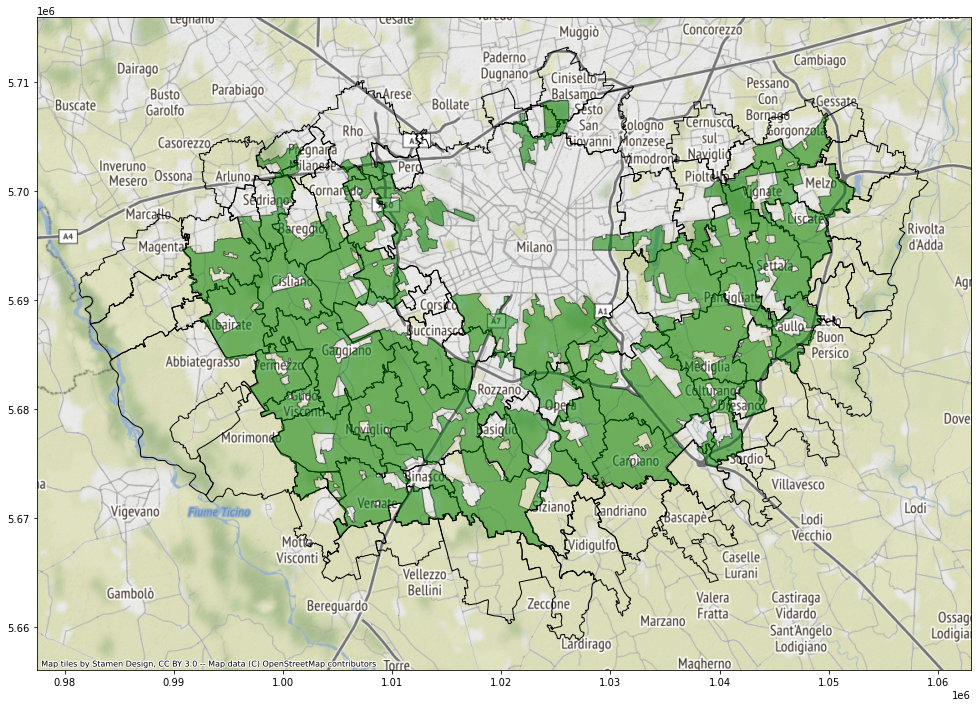

In [16]:
ax= comuni_Intersects.to_crs(epsg=3857).plot(figsize=(24,12),facecolor="none",linewidth=1, edgecolor= "k")
parchi_Milano.to_crs(epsg= 3857).plot(ax=ax, facecolor = "green",alpha=0.5, edgecolor= "k")
contextily.add_basemap(ax)

2. analogo al primo esercizio ma tracciando sulla mappa solo i quartieri di Milano attraversati da parchi (e non tutta la città)

In [18]:
quartieri = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/ds964_nil_wm.zip")
quartieri

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
2,67,PORTELLO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3800.750663,9.096022e+05,91,"POLYGON ((9.15636 45.48785, 9.15724 45.48721, ..."
3,81,BOVISASCA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7105.469715,1.578028e+06,92,"POLYGON ((9.16803 45.52234, 9.16687 45.52027, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
...,...,...,...,...,...,...,...,...,...
83,68,PAGANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5221.836696,1.289686e+06,172,"POLYGON ((9.17174 45.47619, 9.17150 45.47595, ..."
84,2,BRERA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5461.667196,1.637333e+06,173,"POLYGON ((9.19165 45.46906, 9.19105 45.46843, ..."
85,33,ROGOREDO - SANTA GIULIA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6012.496435,1.200116e+06,174,"POLYGON ((9.24044 45.44427, 9.24084 45.44424, ..."
86,17,ADRIANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,9276.875747,2.433358e+06,175,"POLYGON ((9.26729 45.51234, 9.26701 45.51241, ..."


In [19]:
quartieri_attra = quartieri[quartieri.intersects(parchi_Milano.to_crs(epsg=4326).unary_union)]
quartieri_attra

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
9,61,QUARTO CAGNINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,4648.169991,9.863542e+05,98,"POLYGON ((9.11143 45.47640, 9.11193 45.47624, ..."
10,60,STADIO - IPPODROMI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8277.734101,3.435178e+06,99,"POLYGON ((9.13020 45.48464, 9.13075 45.48449, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
20,83,BRUZZANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6441.288643,1.670440e+06,109,"POLYGON ((9.17808 45.53479, 9.17807 45.53439, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
24,39,QUINTOSOLE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6740.830821,1.058525e+06,113,"POLYGON ((9.21047 45.39699, 9.21039 45.39698, ..."


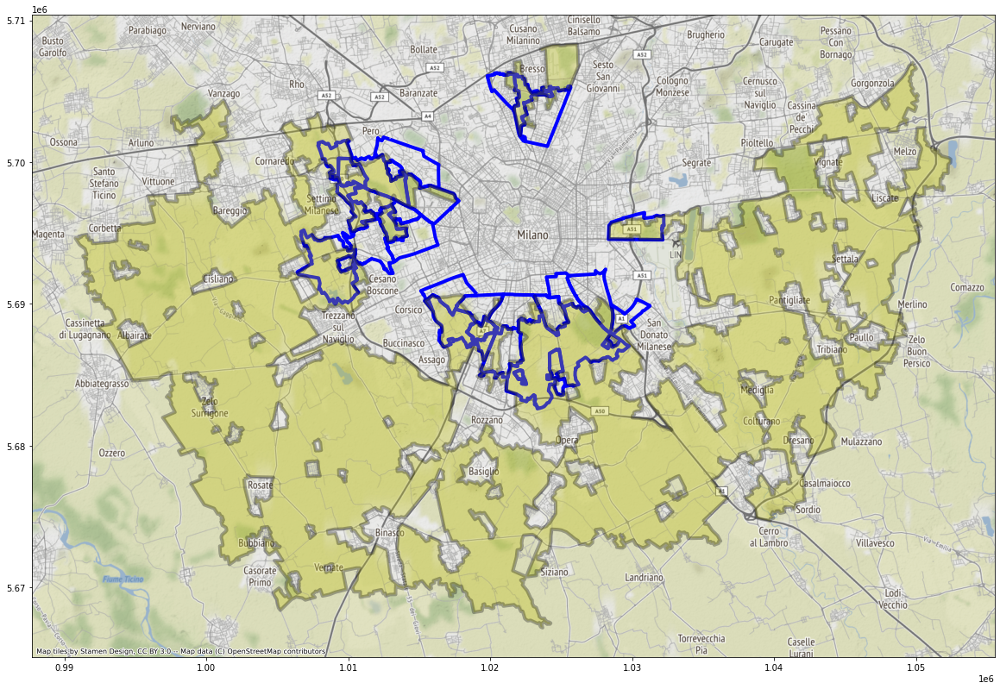

In [20]:
ax = quartieri_attra.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none", edgecolor = "b", linewidth = 4)
parchi_Milano.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y",linewidth=4, alpha = 0.3, edgecolor = "k" )
contextily.add_basemap(ax=ax)

3.  dato il nome di un parco, avere la mappa del parco con i comuni che lo ospitano

Inserire il nome di un parco: Parco Monte Barro


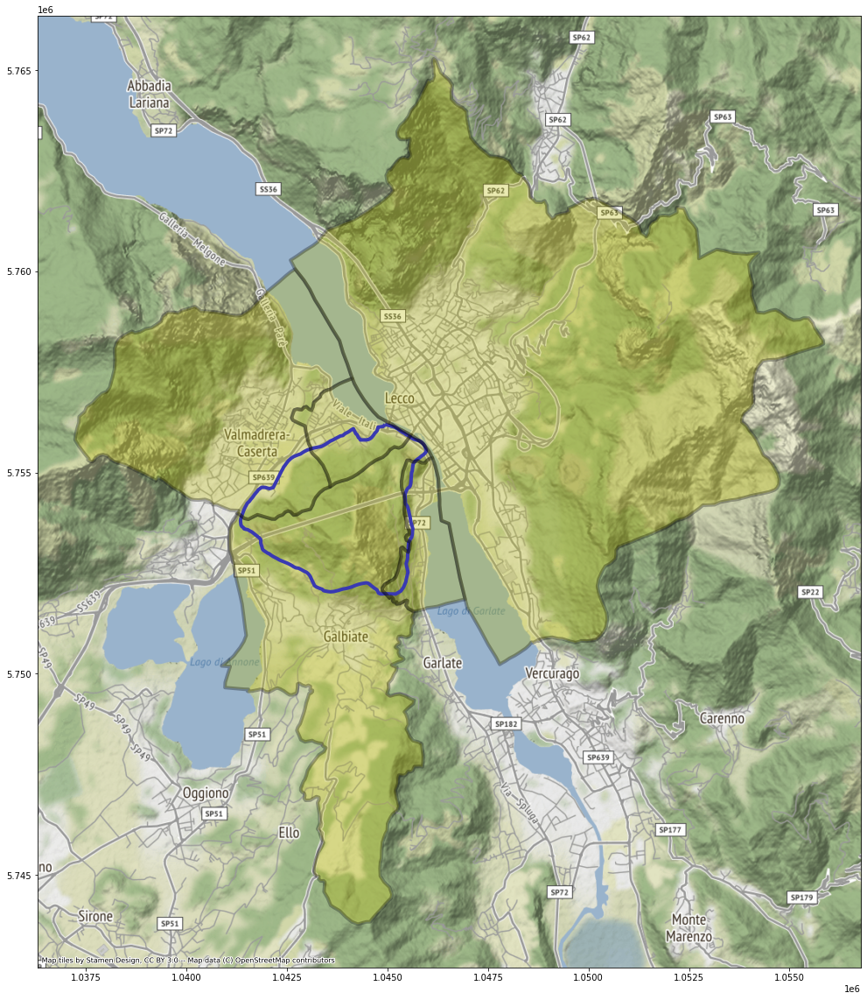

In [21]:
nome_parco = input("Inserire il nome di un parco: ")
parco = parchi[parchi["NOME"] == nome_parco]
squeeze_parco = parco.geometry.squeeze()

comuni_parco =  Comuni[Comuni.intersects(squeeze_parco)]
comuni_parco

ax = parco.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none", edgecolor = "b", linewidth = 4)
comuni_parco.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y",linewidth=4, alpha = 0.3, edgecolor = "k" )
contextily.add_basemap(ax=ax)

4. dato il nome di un parco, avere la mappa del parco con le province che attraversa

Inserisci il nome di un parco: Parco Monte Barro


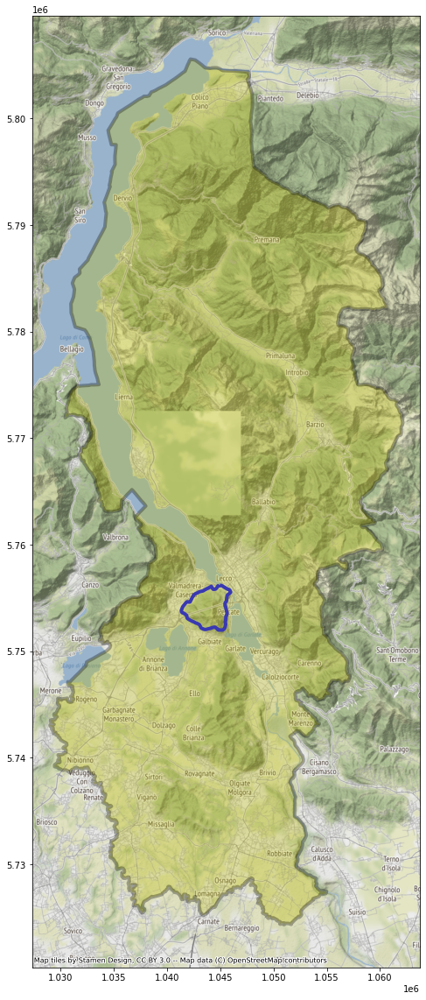

In [23]:
nome_parco = input("Inserisci il nome di un parco: ")
parco = parchi[parchi["NOME"] == nome_parco]
squeeze_parco = parco.geometry.squeeze()

province_parco =  Province[Province.intersects(squeeze_parco)]
province_parco

ax = parco.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none", edgecolor = "b", linewidth = 4)
province_parco.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y",linewidth=4, alpha = 0.3, edgecolor = "k" )
contextily.add_basemap(ax=ax)

5. dato un comune, avere i parchi che ospita (elenco e mappa)

Inserisci il nome di un comune: Bresso
i parchi ospitati all'interno di questo comune sono: 
 20    Parco Nord Milano
Name: NOME, dtype: object


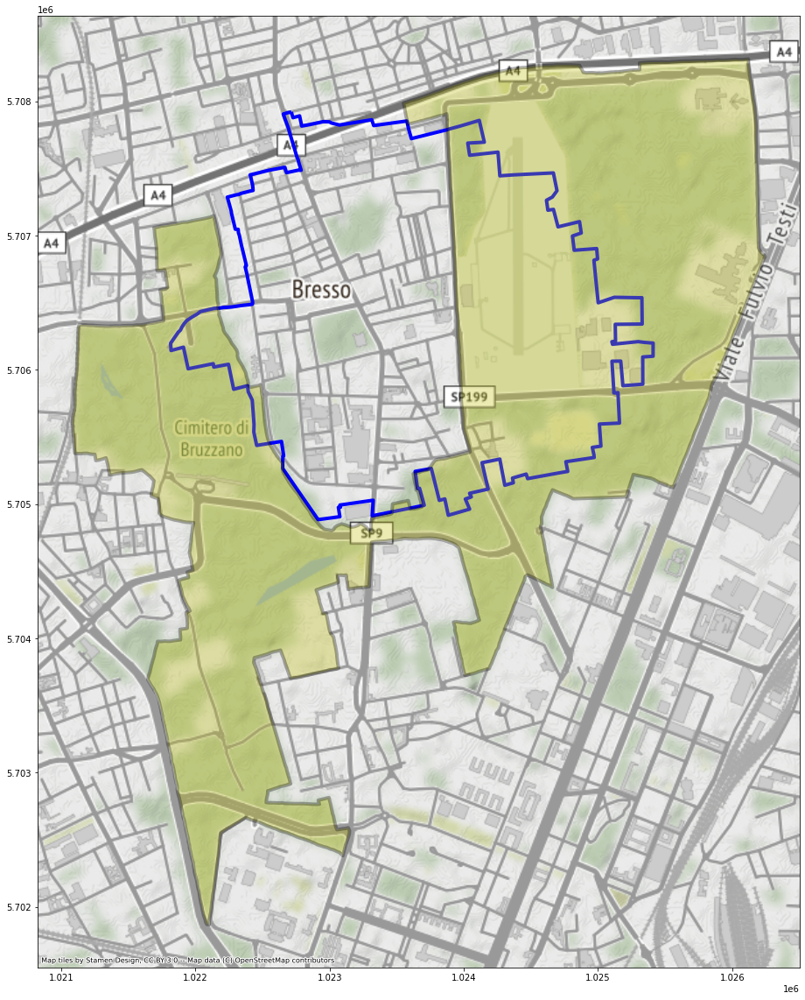

In [24]:
nome_comune = input("Inserisci il nome di un comune: ")
comune = Comuni[Comuni["COMUNE"] == nome_comune]
squeeze_comune = comune.geometry.squeeze()

parchi_comune =  parchi[parchi.intersects(squeeze_comune)]
parchi_comune

print("i parchi ospitati all'interno di questo comune sono: \n", parchi_comune.NOME)

ax = comune.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none", edgecolor = "b", linewidth = 4)
parchi_comune.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y",linewidth=4, alpha = 0.3, edgecolor = "k" )
contextily.add_basemap(ax=ax)

6. dato il nome di una provincia, avere i parchi che ospita (elenco e mappa)

Inserisci il nome di una provincia: Lecco
I parchi ospitati da  Lecco  sono: 
 0                     Parco Alpi Orobie Valtellinesi
1                      Parco Alpi Orobie Bergamasche
8                                    Parco Adda Nord
11                                 Parco Monte Barro
14    Parco di Montevecchia e della Valle del Curone
15                            Parco Valle del Lambro
Name: NOME, dtype: object


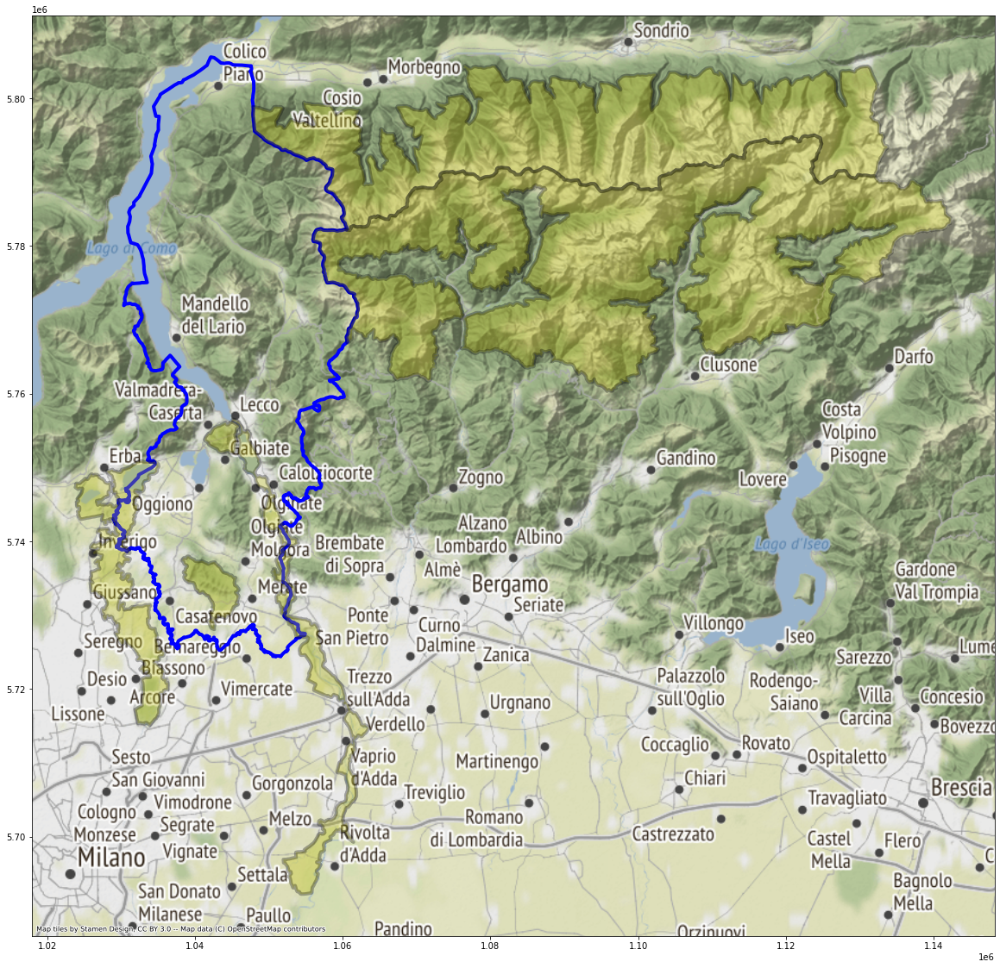

In [25]:
nome_provincia = input("Inserisci il nome di una provincia: ")
provincia = Province[Province["DEN_UTS"] == nome_provincia]
squeeze_provincia = provincia.geometry.squeeze()

parchi_nella_provincia =  parchi[parchi.intersects(squeeze_provincia)]
parchi_nella_provincia

print("I parchi ospitati da ", nome_provincia, " sono: \n", parchi_nella_provincia.NOME)

ax = provincia.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none", edgecolor = "b", linewidth = 4)
parchi_nella_provincia.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y",linewidth=4, alpha = 0.3, edgecolor = "k" )
contextily.add_basemap(ax=ax)